# Import Data

In [1]:
%pylab inline
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker
import cartopy.feature as cfeature
import xarray as xr
import pandas as pd
import seaborn as sns
import numpy as np
import plotly.express as px

sns.set_style("whitegrid")

Populating the interactive namespace from numpy and matplotlib


In [2]:
# ds = pd.read_csv("../patagonia_new_outputs/M2",
#                   delim_whitespace=True,header=None)
ds = pd.read_csv("EOTsla34_avgSla_VCE_varCap_lat_indonesia/M2",
                  delim_whitespace=True,header=None)


In [3]:
x = np.array(ds[0].data)
y = np.array(ds[1].data)

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Series.data is deprecated and will be removed in a future version

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning:

Series.data is deprecated and will be removed in a future version



In [4]:

fig = px.scatter_mapbox(lon=ds[0], lat=ds[1],color=ds[7]+180,color_continuous_scale=px.colors.sequential.Jet)
fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=3.5,)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [136]:
fig.

AttributeError: 'Figure' object has no attribute 'plot'

am = amplitude, cm //
sam = cm std of am //
sph = degrees std of ph //
ph = phase, degrees //
sigmaX = standard deviation of drift

longitude, latitude, x(jj), x(jj+1), sigmaX(jj), sigmaX(jj+1), am, ph,
sam, sph




# Plotting of Tidal Amplitude and Phase

In [6]:
def colormap(xx,yy,zz):
    
    lon = xx
    lat = yy
    vel = zz

    xx = np.linspace(xx.min(), xx.max(), 25)
    yy = np.linspace(yy.min(), yy.max(), 25)
    longitudes, latitudes = np.meshgrid(xx, yy, sparse=True)

    longitudes = np.squeeze(longitudes)
    latitudes = np.squeeze(latitudes)
    velocities = np.zeros([len(longitudes),len(latitudes)])
    velocities[:] = np.nan
    indxcheck = np.zeros([len(longitudes),len(latitudes)])

    # loop through the grid, find lon/lat values for each 0.25 grid cell and average corresponding velocities
    for i in np.arange(0, len(longitudes)-1, 1):
        for j in np.arange(0, len(latitudes)-1, 1):
            indx = np.where((lon>=longitudes[i]) & (lon<longitudes[i+1]) & (lat>=latitudes[j]) & (lat<latitudes[j+1]))[0]
            indxcheck[i,j]=len(indx)
            # if no drifters found put a nan in the grid cell
            if indx.size == 0:
                velocities[i,j] = np.nan
            else:
                velocities[i,j] = np.mean(vel[indx])

    # needed to transpose to plot it with pcolormesh
    velocities = np.transpose(velocities)
    # needed to make it a masked array to make nan appear as white in pcolormesh
    velocities = ma.masked_where(np.isnan(velocities),velocities)
    return(longitudes, latitudes, velocities)


In [7]:
ds1 = pd.read_csv("../patagonia_new_outputs/M2",
                  delim_whitespace=True,header=None)
ds2 = pd.read_csv("../patagonia_new_outputs/S2",
                  delim_whitespace=True,header=None)
ds3 = pd.read_csv("../patagonia_new_outputs/M4",
                  delim_whitespace=True,header=None)
x = np.array(ds1[0].data)
y = np.array(ds1[1].data)
def plotting(ds1,ds2,ds3):


    res = '10m'
    fig = plt.figure(figsize=(16,11), dpi =320)

    land=cfeature.NaturalEarthFeature('physical','land',res,edgecolor='face',
                                     facecolor=cfeature.COLORS['land'])

    proj = ccrs.Mercator()
    ax = plt.subplot(231,projection = proj)
    plt.rcParams.update({'font.size': 13})

    pc = ccrs.PlateCarree()
    extent = [x.min(),
              x.max(),
              y.min(),
              y.max()]

    ax.set_extent(extent,pc)

    ax.add_feature(land,facecolor='black',zorder=10)
    ax.coastlines(resolution=res)
    cb = ax.scatter(x,y,c=np.sqrt(ds1[6]**2),s=75,marker='p',transform=pc,zorder=3,
                    cmap=plt.cm.Spectral_r,vmax=7)
    ax.text(-70,-42,s="M$_2$",transform=pc,zorder=11,c='white',fontsize=20)

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    gl.xlabels_bottom = False
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])
    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    ax1 = plt.subplot(232,projection = proj,)

    ax1.set_extent(extent,pc)

    ax1.add_feature(land,facecolor='black',zorder=10)
    ax1.coastlines(resolution=res)
    cb = ax1.scatter(x,y,c=np.sqrt(ds2[6]**2),s=75,marker='p',transform=pc,zorder=3,
                     cmap=plt.cm.Spectral_r,vmax=7)

    gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    gl.xlabels_bottom = False
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])
    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax1.text(-70,-42,s="S$_2$",transform=pc,zorder=11,c='white',fontsize=20)

    
    ax2 = plt.subplot(233,projection = proj,)

    ax2.set_extent(extent,pc)

    ax2.add_feature(land,facecolor='black',zorder=10)
    ax2.coastlines(resolution=res)
    cb = ax2.scatter(x,y,c=np.sqrt(ds3[6]**2),s=75,marker='p',transform=pc,zorder=3,
                     cmap=plt.cm.Spectral_r,vmax=7)

    gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    gl.xlabels_bottom = False
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])
    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax2.text(-70,-42,s="M$_4$",transform=pc,zorder=11,c='white',fontsize=20)

    cbar = plt.colorbar(cb,shrink=1)

    ax3 = plt.subplot(234,projection = proj,)
    ax3.set_extent(extent,pc)
    ax3.add_feature(land,facecolor='black',zorder=10)
    ax3.coastlines(resolution=res)
    xx,yy,vel = colormap(x,y,ds1[7]+180)
    cb = ax3.contourf(xx,yy,vel,cmap=plt.cm.gist_rainbow,vmax=360,transform=pc,
                     levels=[15,30,45,60,75,90,105,120,135,150,165,180,195,210,225,
                            240,255,270,285,300,315,330,345,360])
#     cb = ax3.scatter(x,y,c=ds1[7]+180,s=75,marker='p',transform=pc,zorder=3,
#                      cmap=plt.cm.gist_rainbow,vmax=360)
    gl = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    ax3.text(-70,-42,s="M$_2$",transform=pc,zorder=11,c='white',fontsize=20)

    gl.xlabels_bottom = True
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])
    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
        
    ax4 = plt.subplot(235,projection = proj,)
    ax4.set_extent(extent,pc)
    ax4.add_feature(land,facecolor='black',zorder=10)
    ax4.coastlines(resolution=res)
    xx,yy,vel = colormap(x,y,ds2[7]+180)
    cb = ax4.contourf(xx,yy,vel,cmap=plt.cm.gist_rainbow,vmax=360,transform=pc,
                     levels=[15,30,45,60,75,90,105,120,135,150,165,180,195,210,225,
                            240,255,270,285,300,315,330,345,360])

#     cb = ax4.scatter(x,y,c=ds2[7]+180,s=75,marker='p',transform=pc,zorder=3,
#                      cmap=plt.cm.gist_rainbow,vmax=360)
    gl = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    ax4.text(-70,-42,s="S$_2$",transform=pc,zorder=11,c='white',fontsize=20)
    gl.xlabels_bottom = True
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])
    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    ax5 = plt.subplot(236,projection = proj,)
    ax5.set_extent(extent,pc)
    ax5.add_feature(land,facecolor='black',zorder=10)
    ax5.coastlines(resolution=res)
    xx,yy,vel = colormap(x,y,ds3[7]+180)
    cb = ax5.contourf(xx,yy,vel,cmap=plt.cm.gist_rainbow,vmax=360,transform=pc,
                     levels=[15,30,45,60,75,90,105,120,135,150,165,180,195,210,225,
                            240,255,270,285,300,315,330,345,360])
#     cb = ax5.scatter(x,y,c=ds3[7]+180,s=75,marker='p',transform=pc,zorder=3,
#                      cmap=plt.cm.gist_rainbow,vmax=360)
    gl = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=1, linestyle='--',zorder=20)
    ax5.text(-70,-42,s="M$_4$",transform=pc,zorder=11,c='white',fontsize=20)

    gl.xlabels_bottom = True
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.ylabels_right = False
    gl.ylocator = mticker.FixedLocator([-35,-40, -45, -50, -55, -60, -65])
    gl.xlocator = mticker.FixedLocator([-75,-70, -65, -60, -55, -50, -40])

    gl.xlines = True
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    cbar = plt.colorbar(cb,shrink=1)
    fig.subplots_adjust(hspace=0.1, wspace=-0.25)
    ax.set_title( 'Amplitude, cm')
    ax1.set_title('Amplitude, cm')
    ax2.set_title('Amplitude, cm')
    ax3.set_title('Phase, degrees')
    ax4.set_title('Phase, degrees')
    ax5.set_title('Phase, degrees')

    plt.tight_layout()
    try:
        plt.savefig(str(title)+stype,dpi=320)
    except: pass
    plt.show()

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

Series.data is deprecated and will be removed in a future version

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning:

Series.data is deprecated and will be removed in a future version



/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:177: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 



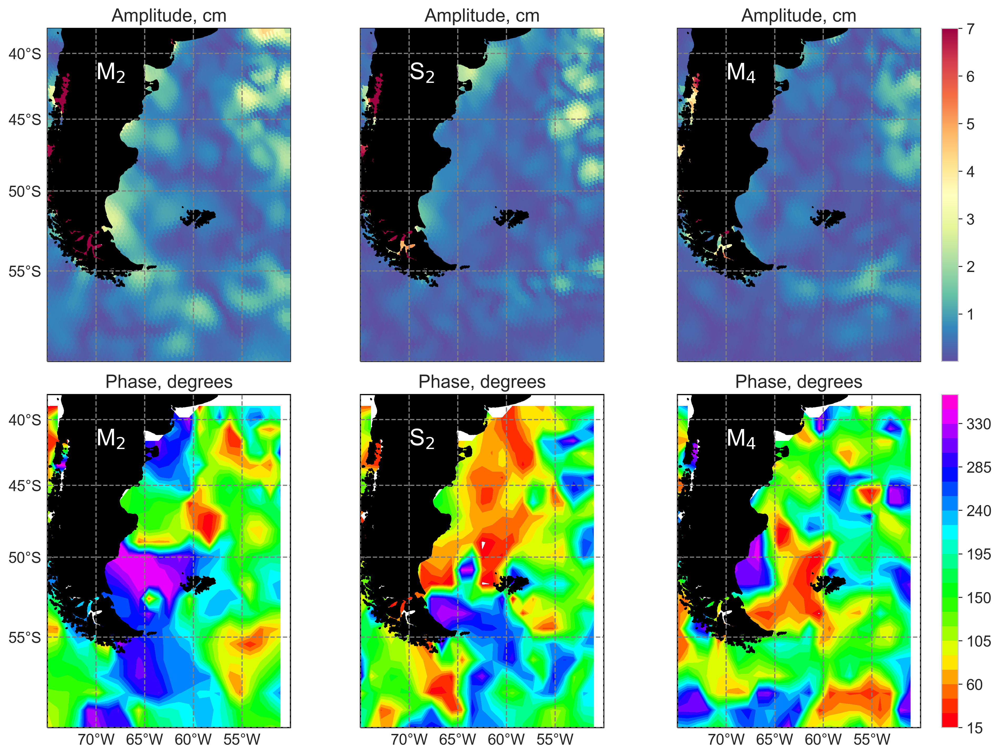

In [8]:
plotting(ds1,ds2,ds3)#,title='indo',stype='.pdf')

# Plotting One Constituent

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

Series.data is deprecated and will be removed in a future version

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

Series.data is deprecated and will be removed in a future version

/Users/hart-davis/miniconda3/envs/py3_parcels/lib/python3.7/site-packages/ipykernel_launcher.py:107: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



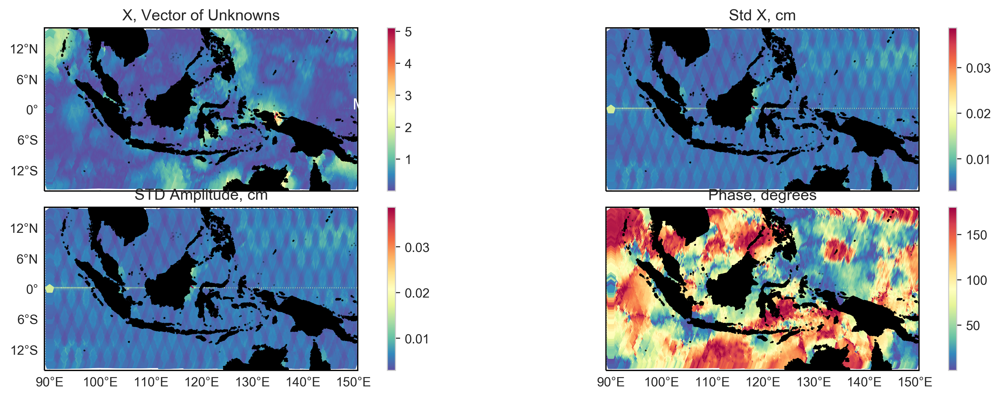

In [14]:
ds = pd.read_csv("EOTsla34_avgSla_VCE_varCap_lat_indonesia/M2",
                  delim_whitespace=True,header=None)
x = np.array(ds[0].data)
y = np.array(ds[1].data)
res = '10m'
plt.rcParams.update({'font.size': 10})
fig = plt.figure(figsize=(16,10), dpi =320)

land=cfeature.NaturalEarthFeature('physical','land',res,edgecolor='face',
                                 facecolor=cfeature.COLORS['land'])

proj = ccrs.Mercator()
ax = plt.subplot(421,projection = proj)

pc = ccrs.PlateCarree()
extent = [x.min()-1,
          x.max()+1,
          y.min()-1,
          y.max()+1]

ax.set_extent(extent,pc)

ax.add_feature(land,facecolor='black',zorder=10)
ax.coastlines(resolution=res)
cb = ax.scatter(x,y,c=np.sqrt(ds[2]**2),
                s=40,marker='p',transform=pc,zorder=3,cmap=plt.cm.Spectral_r)
ax.text(x[2],y[-1],s="M$_2$",transform=pc,zorder=11,c='white',fontsize=12)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.25, linestyle='--')
gl.xlabels_bottom = False
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False

gl.xlines = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
ax.set_title('X, Vector of Unknowns')
cbar = plt.colorbar(cb,shrink=1)

ax1 = plt.subplot(422,projection = proj,)

ax1.set_extent(extent,pc)

ax1.add_feature(land,facecolor='black',zorder=10)
ax1.coastlines(resolution=res)
cb = ax1.scatter(x,y,c=ds[4],s=40,marker='p',transform=pc,zorder=3,
                 cmap=plt.cm.Spectral_r)

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.25, linestyle='--')
gl.xlabels_bottom = False
gl.xlabels_top = False
gl.ylabels_left = False
gl.ylabels_right = False

gl.xlines = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

cbar = plt.colorbar(cb,shrink=1)
ax1.set_title('Std X, cm')


ax2 = plt.subplot(423,projection = proj)
ax2.set_extent(extent,pc)
ax2.add_feature(land,facecolor='black',zorder=10)
ax2.coastlines(resolution=res)
cb = ax2.scatter(x,y,c=ds[8],s=40,marker='p',transform=pc,zorder=3,
                 cmap=plt.cm.Spectral_r)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.25, linestyle='--')
gl.xlabels_bottom = True
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False

gl.xlines = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

cbar = plt.colorbar(cb,shrink=1)
ax2.set_title('STD Amplitude, cm')

ax3 = plt.subplot(424,projection = proj)
ax3.set_extent(extent,pc)
ax3.add_feature(land,facecolor='black',zorder=10)
ax3.coastlines(resolution=res)
cb = ax3.scatter(x,y,c=np.sqrt(ds[7]**2),s=40,marker='p',transform=pc,zorder=3,
                 cmap=plt.cm.Spectral_r)
gl = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.25, linestyle='--')
gl.xlabels_bottom = True
gl.xlabels_top = False
gl.ylabels_left = False
gl.ylabels_right = False
ax3.set_title('Phase, degrees')

gl.xlines = True
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

cbar = plt.colorbar(cb,shrink=1)
fig.subplots_adjust(hspace=0.1, wspace=-.05)

plt.tight_layout()
# plt.savefig("M2_southafrica.png",)
plt.show()

# Line Graphs of Some Components

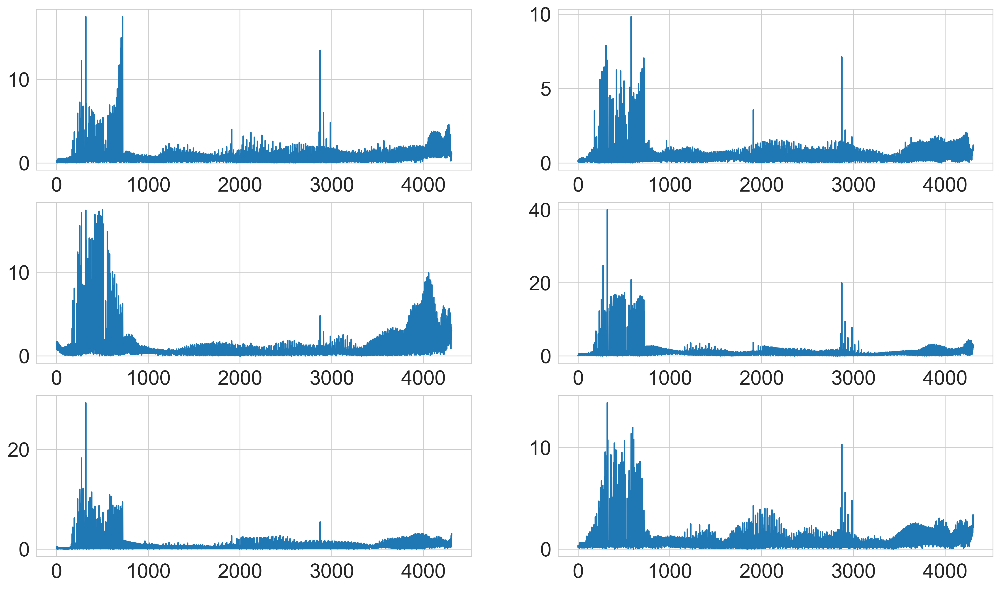

In [10]:
plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize=(17,10), dpi =320)

ds = pd.read_csv("../patagonia_new_outputs/Q1",
                  delim_whitespace=True,header=None)

plt.subplot(321)
plt.plot(ds[6])

ds = pd.read_csv("../patagonia_new_outputs/M4",
                  delim_whitespace=True,header=None)
plt.subplot(322)
plt.plot(ds[6])

ds = pd.read_csv("../patagonia_new_outputs/K1",
                  delim_whitespace=True,header=None)
plt.subplot(323)
plt.plot(ds[6])

ds = pd.read_csv("../patagonia_new_outputs/M2",
                  delim_whitespace=True,header=None)
plt.subplot(324)
plt.plot(ds[6])

ds = pd.read_csv("../patagonia_new_outputs/S2",
                  delim_whitespace=True,header=None)
plt.subplot(325)
plt.plot(ds[6])

ds = pd.read_csv("../patagonia_new_outputs/P1",
                  delim_whitespace=True,header=None)
plt.subplot(326)
plt.plot(ds[6])

